Laboratorio #6 – Clasificación de malware con DL
- Marco Ramírez
- Estuardo Hernández

In [4]:
# Importar librerías a utilizar
import numpy as np
import matplotlib.pyplot as plt
import os
import tensorflow as tf
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.layers import Dense, Input, Dropout,Flatten, Conv2D
from tensorflow.keras.layers import BatchNormalization, Activation, MaxPooling2D, UpSampling2D, AveragePooling2D,ZeroPadding2D,Convolution2D
from tensorflow.keras.models import Model, Sequential
from tensorflow.keras.optimizers import Adam, SGD
from tensorflow.keras.callbacks import ModelCheckpoint, ReduceLROnPlateau
from tensorflow.keras.utils import plot_model
import tensorflow.keras.backend as K
from IPython.display import SVG, Image
#import cv2
import utils

Plotear las imágenes de los ejemplos de malware.

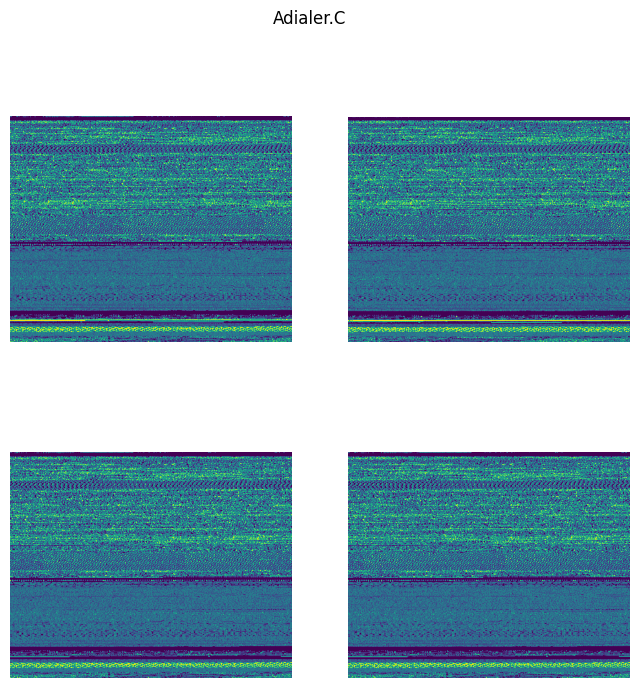

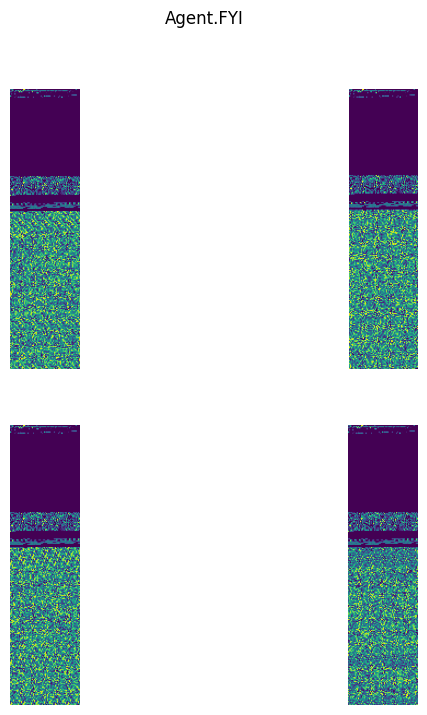

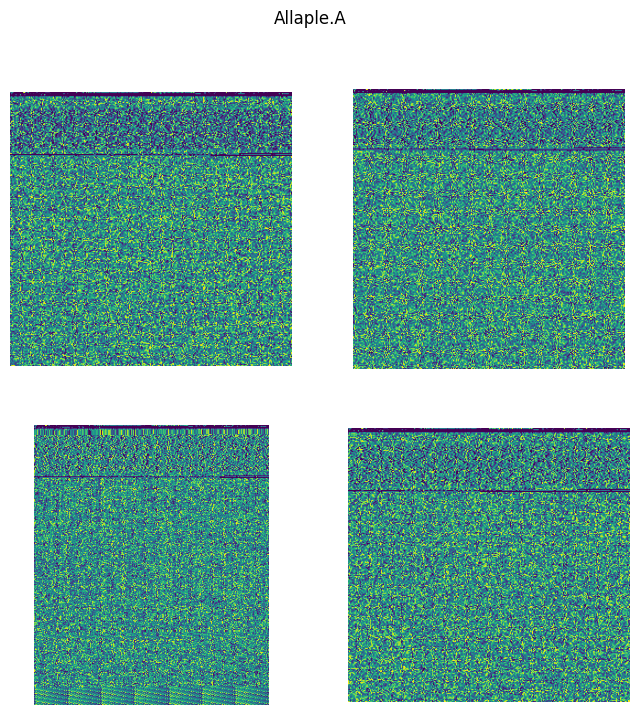

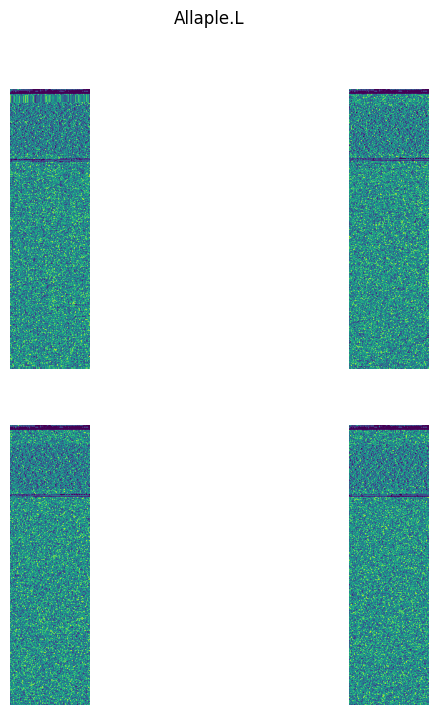

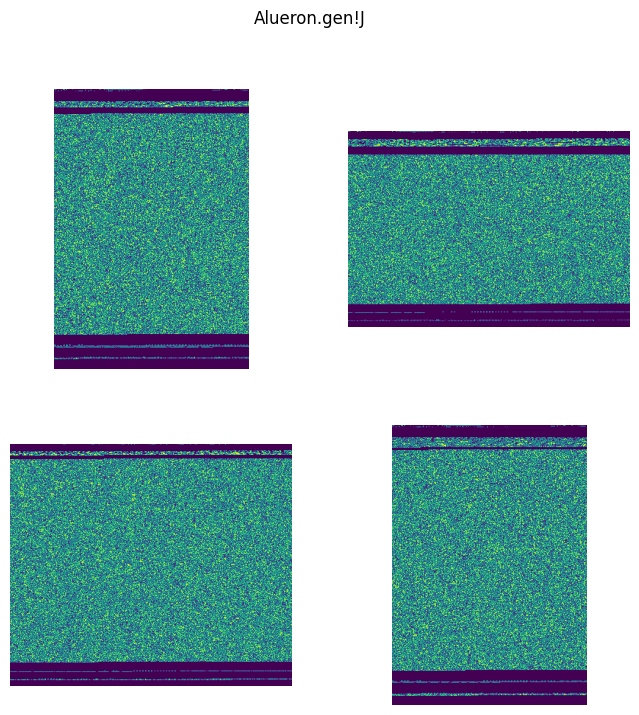

...

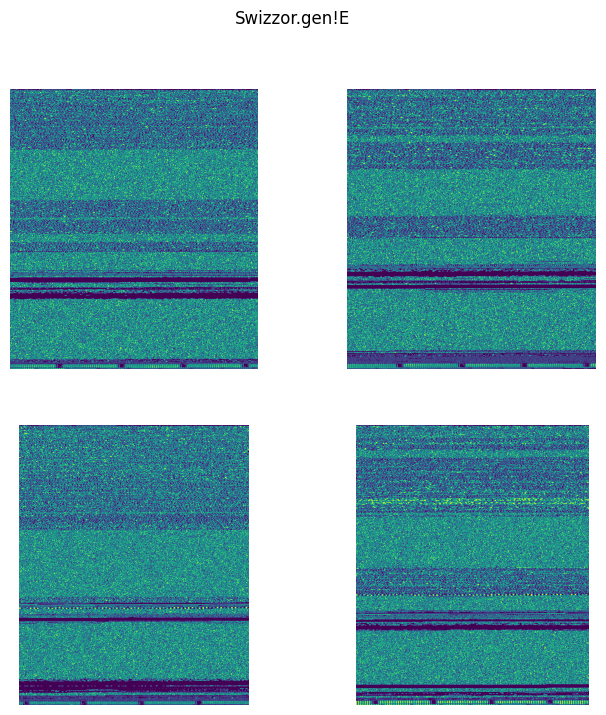

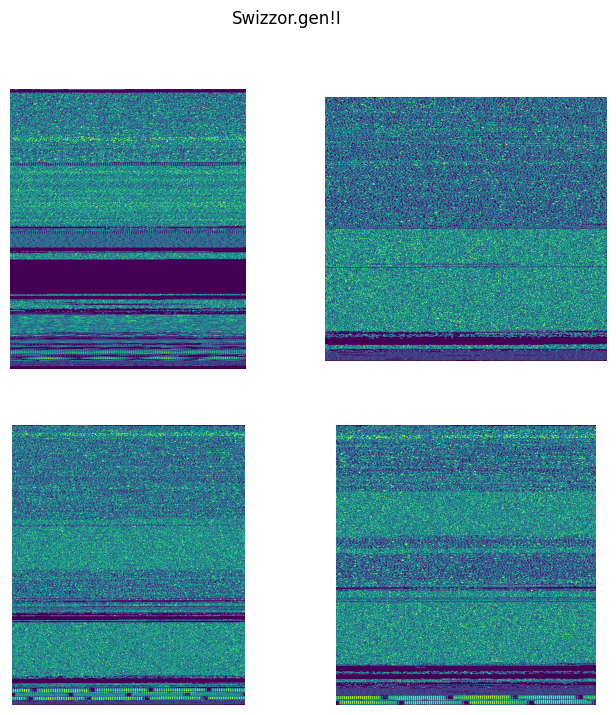

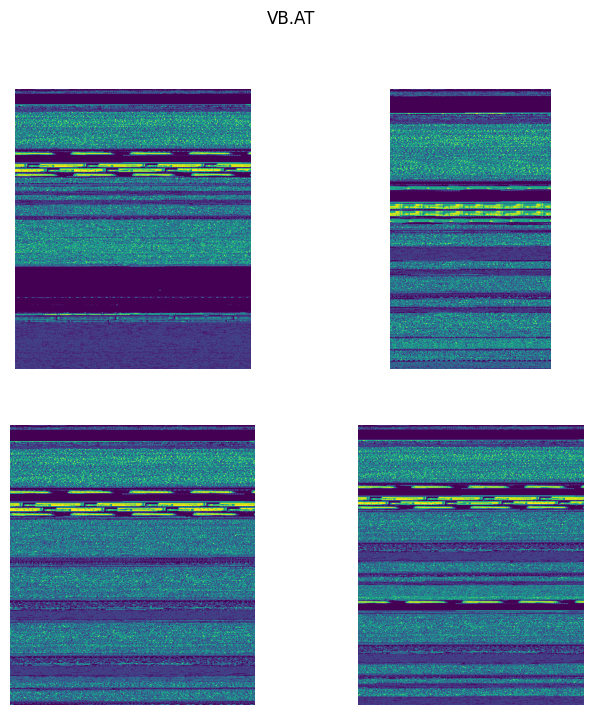

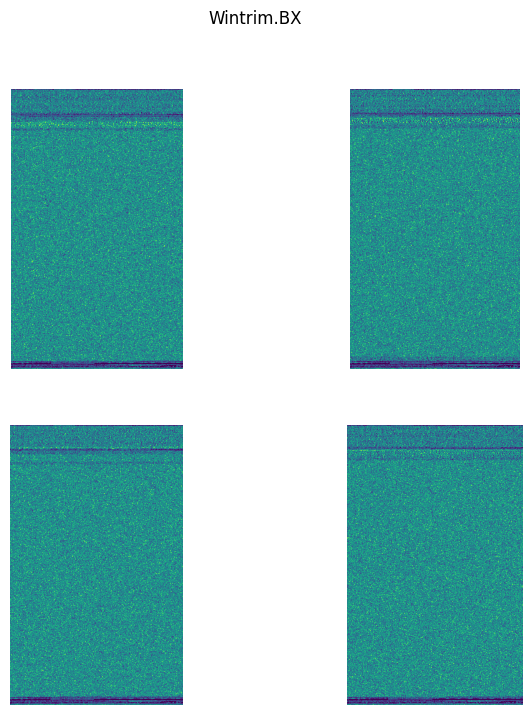

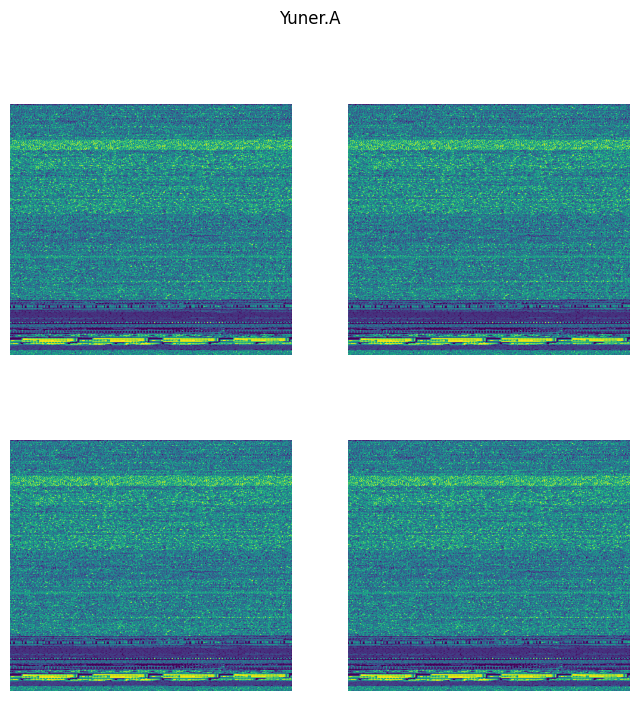

In [7]:
# Importar librerías a utilizar
import os
import matplotlib.pyplot as plt
import matplotlib.image as mpimg

# Definir la ruta a la carpeta principal
zipFile = './malimg_paper_dataset_imgs/'

# Obtener una lista de todas las carpetas en la carpeta principal
folders = os.listdir(zipFile)

# Iterar a través de cada carpeta y mostrar las primeras 4 imágenes
for folder in folders:
    # Obtener la ruta completa de la carpeta actual
    folder_path = os.path.join(zipFile, folder)
    
    # Obtener una lista de todas las imágenes en la carpeta actual
    images = os.listdir(folder_path)
    
    # Crear una figura con 4 subplots
    fig, axs = plt.subplots(2, 2, figsize=(8, 8))
    
    # Iterar a través de las primeras 4 imágenes y mostrarlas en los subplots
    for i in range(4):
        # Obtener la ruta completa de la imagen actual
        image_path = os.path.join(folder_path, images[i])
        
        # Cargar la imagen y mostrarla en el subplot correspondiente
        img = mpimg.imread(image_path)
        axs[i//2, i%2].imshow(img)
        axs[i//2, i%2].axis('off')
        
    # Establecer el título de la figura como el nombre de la carpeta
    fig.suptitle(folder)
    
    # Mostrar la figura
    plt.show()

Mostrar cuantos ejemplares hay por cada familia.

In [9]:
# Crear un diccionario para contar las imágenes por familia
family_types = []
# Recorrer todas las carpetas
for types in os.listdir("./malimg_paper_dataset_imgs/"):
    # Imprimir el número de imágenes que hay en cada carpeta y su nombre
    print(str(len(os.listdir("./malimg_paper_dataset_imgs/"+ types)))+" "+ types+' images')
    # Agregar cada nombre al final de la lista
    family_types.append(types)
#Crear diccionario para el conteo de imágenes por familia
family_label = {family_type:i for i, family_type in enumerate(family_types)}

122 Adialer.C images
116 Agent.FYI images
2949 Allaple.A images
1591 Allaple.L images
198 Alueron.gen!J images
106 Autorun.K images
200 C2LOP.gen!g images
146 C2LOP.P images
177 Dialplatform.B images
162 Dontovo.A images
381 Fakerean images
431 Instantaccess images
213 Lolyda.AA1 images
184 Lolyda.AA2 images
123 Lolyda.AA3 images
159 Lolyda.AT images
136 Malex.gen!J images
142 Obfuscator.AD images
158 Rbot!gen images
80 Skintrim.N images
128 Swizzor.gen!E images
132 Swizzor.gen!I images
408 VB.AT images
97 Wintrim.BX images
800 Yuner.A images


Dividir el dataset en un 70% entrenamiento y un 30% de pruebas.

In [10]:
# Dimensiones de cada imagen
image_size=(80,80)
# Tamaño del lote de datos por cada iteración
batch_size = 32
# Aplicar inversión horizontal a la imagen
datagen_train=ImageDataGenerator(horizontal_flip=True)
# Crear el generador de datos de entrenamiento con los parámetros definidos
train_generator=datagen_train.flow_from_directory("./malimg_paper_dataset_imgs/",
    target_size=image_size,
    batch_size=batch_size,
    class_mode='categorical',
    color_mode ="rgb",
    shuffle=True,
    subset='training'
) # Este subset permite obtener un subconjunto de los datos de entrenamiento, en este caso se obtiene el 70% de los datos para entrenamiento

# Aplicar inversión horizontal a la imagen
datagen_test=ImageDataGenerator(horizontal_flip=True)
# Crear el generador de datos de pruebas con los parámetros definidos
test_generator=datagen_test.flow_from_directory("./malimg_paper_dataset_imgs/",
    target_size=image_size,
    batch_size=batch_size,
    class_mode='categorical',
    color_mode ="rgb",
    shuffle=True,
    subset='training'
) # Este subset permite obtener un subconjunto de los datos de entrenamiento, en este caso se obtiene el 30% de los datos para pruebas

Found 9339 images belonging to 25 classes.
Found 9339 images belonging to 25 classes.


Crear una red neuronal convolucional (CNN).

In [12]:
# Modelo secuencial
CNNmodel = Sequential()
# Agregar capa convolucional que mantiene la dimensión de la imagen en 80x80 pixeles y color RGB
CNNmodel.add(Conv2D(8, (3, 3), activation='relu', padding='same', input_shape=(80, 80, 3)))
# Capa para normalización de los datos, acelera el entrenamiento y mejora la precisón
CNNmodel.add(BatchNormalization())
# Otra capa concolucional
CNNmodel.add(Conv2D(8, (3, 3), activation='relu',  padding='same'))
# Otra capa de normalización
CNNmodel.add(BatchNormalization())
# Agregar capa de agrupación máxima, reduce la resolución a la mitad y así evitar overfitting
CNNmodel.add(MaxPooling2D((2, 2)))

# Más capas con distintos filtros

CNNmodel.add(Conv2D(16, (3, 3), activation='relu', padding='same'))
CNNmodel.add(BatchNormalization())
CNNmodel.add(Conv2D(16, (3, 3), activation='relu',  padding='same'))
CNNmodel.add(BatchNormalization())
CNNmodel.add(MaxPooling2D((2, 2)))


CNNmodel.add(Conv2D(32, (3, 3), activation='relu', padding='same'))
CNNmodel.add(BatchNormalization())
CNNmodel.add(Conv2D(32, (3, 3), activation='relu', padding='same'))
CNNmodel.add(BatchNormalization())
CNNmodel.add(MaxPooling2D((2, 2)))


CNNmodel.add(Conv2D(64, (3, 3), activation='relu', padding='same'))
CNNmodel.add(BatchNormalization())
CNNmodel.add(Conv2D(64, (3, 3), activation='relu',padding='same'))
CNNmodel.add(BatchNormalization())
CNNmodel.add(MaxPooling2D((2, 2)))
# Agregar capa para reducir el overfitting durante el entrenamiento
CNNmodel.add(Dropout(0.15))

# Más capas

CNNmodel.add(Conv2D(96, (3, 3), activation='relu', padding='same'))
CNNmodel.add(BatchNormalization())
CNNmodel.add(Conv2D(128, (3, 3), activation='relu',padding='same'))
CNNmodel.add(BatchNormalization())
CNNmodel.add(MaxPooling2D((2, 2)))
CNNmodel.add(Dropout(0.15))

CNNmodel.add(Conv2D(128, (3, 3), activation='relu', padding='same'))
CNNmodel.add(BatchNormalization())
CNNmodel.add(Conv2D(256, (3, 3), activation='relu',padding='same'))
CNNmodel.add(BatchNormalization())
CNNmodel.add(Conv2D(512, (3, 3), activation='relu',padding='same'))
CNNmodel.add(BatchNormalization())
CNNmodel.add(MaxPooling2D((2, 2)))
CNNmodel.add(Dropout(0.15))

# Capa Flatten para convertir la salida en vector 1D
CNNmodel.add(Flatten())
# Capa densa de 512 neuronas
CNNmodel.add(Dense(512, activation='relu'))
# Capa para clasificación multiclase
CNNmodel.add(Dense(25, activation='softmax'))
# Optimizador Adam
optimum= Adam(learning_rate=0.0001)

# Funciones para las métricas a utilizar (precision y recall)
def precision(y_true, y_pred):
    true_positives = K.sum(K.round(K.clip(y_true * y_pred, 0, 1)))
    predicted_positives = K.sum(K.round(K.clip(y_pred, 0, 1)))
    precision = true_positives / (predicted_positives + K.epsilon())
    return precision
def recall(y_true, y_pred):
    true_positives = K.sum(K.round(K.clip(y_true * y_pred, 0, 1)))
    possible_positives = K.sum(K.round(K.clip(y_true, 0, 1)))
    recall = true_positives / (possible_positives + K.epsilon())
    return recall

# Compilar el modelo CNN con los parámetros definidos
CNNmodel.compile(loss='categorical_crossentropy', optimizer=optimum, metrics=['accuracy',recall,precision,tf.keras.metrics.AUC(curve="ROC"),tf.keras.metrics.FalsePositives(),tf.keras.metrics.TruePositives(),tf.keras.metrics.FalseNegatives(),tf.keras.metrics.TrueNegatives(),tf.keras.metrics.SensitivityAtSpecificity(0.5)])

Mostrar el resumen del modelo.

In [13]:
CNNmodel.summary()

Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_13 (Conv2D)          (None, 80, 80, 8)         224       
                                                                 
 batch_normalization_13 (Bat  (None, 80, 80, 8)        32        
 chNormalization)                                                
                                                                 
 conv2d_14 (Conv2D)          (None, 80, 80, 8)         584       
                                                                 
 batch_normalization_14 (Bat  (None, 80, 80, 8)        32        
 chNormalization)                                                
                                                                 
 max_pooling2d_6 (MaxPooling  (None, 40, 40, 8)        0         
 2D)                                                             
                                                      

Entrenamiento del modelo y mostrar métricas.

In [17]:
# Tamaño del lote de datos
batch_size = 32
# Número de epocas a utilizar
epocs=5
# Calcular el número de pasos por epoca (entrenamiento)
train_steps=train_generator.n//train_generator.batch_size
train_steps
# Calcular el número de pasos por epoca (pruebas)
test_steps=test_generator.n//test_generator.batch_size
test_steps
CNNmodel_trained = CNNmodel.fit(x=train_generator,
                    steps_per_epoch=train_steps,
                    epochs=epocs,
                    validation_data=test_generator,
                    validation_steps=test_steps
                    )

Epoch 1/5
291/291 [==============================] - 160s 535ms/step - loss: 1.4741 - accuracy: 0.5613 - recall: 0.4507 - precision: 0.6587 - auc_1: 0.9376 - false_positives_1: 1914.0000 - true_positives_1: 4194.0000 - false_negatives_1: 5113.0000 - true_negatives_1: 221454.0000 - sensitivity_at_specificity_1: 0.9639 - val_loss: 1.6606 - val_accuracy: 0.4764 - val_recall: 0.3438 - val_precision: 0.5157 - val_auc_1: 0.9372 - val_false_positives_1: 3001.0000 - val_true_positives_1: 3201.0000 - val_false_negatives_1: 6111.0000 - val_true_negatives_1: 220487.0000 - val_sensitivity_at_specificity_1: 0.9869
Epoch 2/5
291/291 [==============================] - 144s 493ms/step - loss: 0.7391 - accuracy: 0.7502 - recall: 0.6955 - precision: 0.8046 - auc_1: 0.9857 - false_positives_1: 1563.0000 - true_positives_1: 6473.0000 - false_negatives_1: 2834.0000 - true_negatives_1: 221805.0000 - sensitivity_at_specificity_1: 0.9928 - val_loss: 0.4695 - val_accuracy: 0.8342 - val_recall: 0.8119 - val_pre

Evaluar el modelo con el dataset de pruebas y mostrar las métricas obtenidas. Discutir los resultados obtenidos.

In [18]:
# Guardar el modelo
CNNmodel.save('malware-class.h5')
# Evaluar el rendimiento con los datos de prueba
CNNmodel.evaluate(test_generator,verbose=1)

292/292 [==============================] - 48s 163ms/step - loss: 0.1536 - accuracy: 0.9415 - recall: 0.9374 - precision: 0.9474 - auc_1: 0.9991 - false_positives_1: 486.0000 - true_positives_1: 8754.0000 - false_negatives_1: 585.0000 - true_negatives_1: 223650.0000 - sensitivity_at_specificity_1: 0.9991


[0.1535796821117401,
 0.941535472869873,
 0.9373929500579834,
 0.9473861455917358,
 0.9990723729133606,
 486.0,
 8754.0,
 585.0,
 223650.0,
 0.9991433620452881]

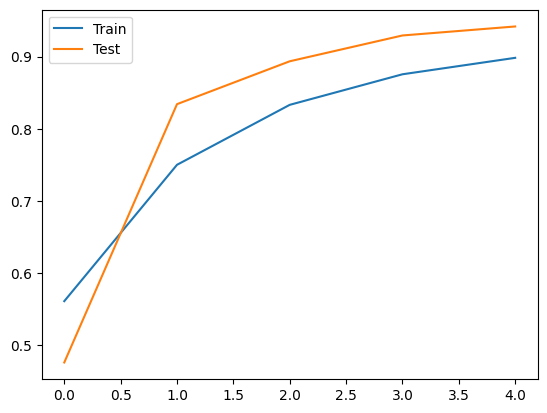

<Figure size 640x480 with 0 Axes>

In [20]:
# Graficar la precisión del modelo en el conjunto de entrenamiento y en el conjunto de pruebas
plt.plot(CNNmodel_trained.history['accuracy'], label='Train')
plt.plot(CNNmodel_trained.history['val_accuracy'], label='Test')
plt.legend()
plt.show()
plt.savefig('AccVal_acc_nonaugmented')

Discusión de resultados:

- loss: 0.1536
Nos da el valor de la función de pérdida del modelo en el conjunto de prueba, como es un valor bajo significa que el rendimiento del modelo es muy bueno.

- accuracy: 0.9415
Esto significa que el 94.15% de las imagenes fueron clasificadas correctamente por el modelo CNN.

- recall: 0.9374
Esto quiere decir que el modelo CNN identifica correctamente el 93.74% de las imágenes de malware.

- precision: 0.9474
Esto nos indica que el modelo CNN tiene una precisión del 94.74%, lo que significa que el 94.74% de las imágenes clasificadas como malware son realmente malware.

- auc_1: 0.9991
Esta métrica, al tener un valor alto, nos dice que el modelo CNN es capaz de distinguir muy bien entre las clases de malware y no malware.

- false_positives_1: 486.0000
El número de falsos positivos significa que 486 imágenes que fueron clasificadas como malware, realmente no lo son.

- true_positives_1: 8754.0000
El número de verdaderos positivos significa que 8754 imágenes fueron clasificadas correctamente como malware.

- false_negatives_1: 585.0000
El número de falsos negativos significa que 585 imágenes que son malware, fueron clasificadas incorrectamente como no malware.

- true_negatives_1: 223650.0000
El número de verdaderos negativos significa que 223650 imágenes fueron clasificadas correctamente como no malware.

- sensitivity_at_specificity_1: 0.9991
Este valor es la sensibilidad del modelo a una especificidad del 50%. Representa la proporción de casos positivos que son correctamente identificados por el modelo cuando se fija una especificidad del 50%. En este caso, el modelo CNN tiene una sensibilidad del 99.91%.

Finalmente, podemos decir que en general, el modelo creado de CNN tuvo un rendimiento muy bueno.